In [2]:
from pathlib import Path
import warnings

import geopandas as gpd
import numpy as np
from numpy.typing import NDArray
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader

# Local imports
from mlp import MLP, MLPDataset, encode

# Ignore warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)


# Constants
BATCH_SIZE = 1028
DATA_DIR = Path(r"C:\Users\Peter\gh\rasmussen-705.603\data\FinalProject")
EPOCHS = 30
GAMMA = 0.1
LAT_SPACE_SIZES = [2, 4, 16, 64, 256,]
LRS = [0.5, 0.1]
OUTPUT_BANDS = ["blue", "green", "red", "nir08", "swir16", "swir22", "ndvi", "qa"]
STEP_SIZES = [5, 10, 15]
TR_VAL_SPLIT = 0.9
WEIGHT_DECAY = 5e-4

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define directories
raw_dir = DATA_DIR / "raw"
interim_dir = DATA_DIR / "interim"
processed_dir = DATA_DIR / "processed"
cogs_dir = interim_dir / "cogs"
autoencoder_dir = processed_dir / "autoencoder"
models_dir = interim_dir / "models"
scores_dir = interim_dir / "scores"
encoded_dir = interim_dir / "encoded"
meta_dir = interim_dir / "meta"

models_dir.mkdir(exist_ok=True, parents=True)
scores_dir.mkdir(exist_ok=True, parents=True)
encoded_dir.mkdir(exist_ok=True, parents=True)
meta_dir.mkdir(exist_ok=True, parents=True)

# Find best model and load it
tr_val_summary = pd.read_csv(scores_dir / "tr_val_summary.csv")
te_summary = pd.read_csv(scores_dir / "te_summary.csv")
optimal_step_size, optimal_lr = te_summary.sort_values(by="te_loss_per_batch").iloc[0][["step_size", "lr"]].values
model_src = models_dir / f"mlp-autoencoder-{int(optimal_step_size)}-{optimal_lr:.3f}.pt"


In [4]:
regions = gpd.read_file(raw_dir / "regions.geojson").set_index("event_key")
for region, region_meta in regions.iterrows():
    # Load dataset
    dataset = MLPDataset(cogs_dir, OUTPUT_BANDS, region=region, train=False, slice_frac=0.01)
    scenes, rows, cols, in_features = dataset.cube.shape
    batch_size = 128
    scenes = dataset.cube.shape[0]
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
    
    # Load model
    in_features = dataset.cube.shape[-1]
    model = MLP(in_features=in_features, hidden_neurons=2)
    model.load_state_dict(torch.load(model_src))
    model.to(device)
    model.eval()
    
    # Encode
    encoded = encode(loader, model, scenes, rows, cols, device)
    
    # Save
    encoded_dst = encoded_dir / f"{region}.npy"
    meta_dst = meta_dir / f"{region}.csv"
    np.save(encoded_dst, encoded)
    dataset.cogs_meta.to_csv(meta_dst, index=False)


af-kharkamar-2022
gm-kanifing-2022
in-cianjur-2022
mg-farafangana-2022
tr-islahiye-2023
us-baltimore-9999


In [5]:
type(device)

torch.device

In [148]:
import matplotlib.pyplot as plt
import plotly.express as px
px.imshow(encoded[-1, :, :, 0])

In [38]:
_, rows, cols, in_features = scene.shape
scene.reshape(1, rows * cols, in_features).shape

torch.Size([1, 30672, 20])

In [110]:
region_meta = regions.set_index("event_key").loc[region]
event_date = pd.Timestamp(region_meta.loc["event_date"])
event = region_meta.loc["maxar_event"]
region_meta

a2                                                            af
event_date                                            2022-06-21
s2_start                                              2016-01-01
s2_end                                                2023-04-29
maxar_event                             afghanistan-earthquake22
geometry       POLYGON ((69.81753875967371 32.97436047484267,...
Name: af-kharkamar-2022, dtype: object

In [149]:
row, col = 451, 474
fig = px.line(
    x=pd.to_datetime(dataset.cogs_meta["solar_date"]),
    y=encoded[:, row, col, 1],
    title=f"Region: {region}, Event Date: {event_date}, Row: {row}, Col: {col}",
    )
fig.show()

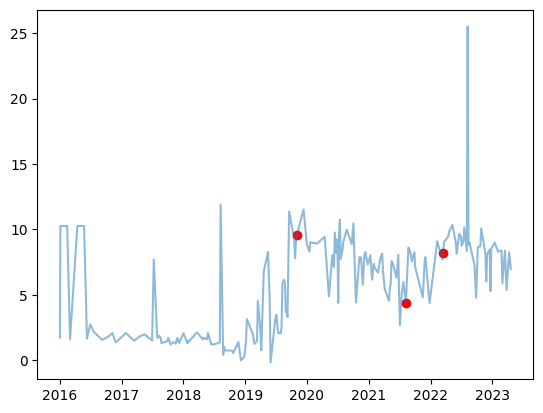

In [172]:

arr = encoded[:, row, col, 1]
bc = BOCD(ConstantHazard(1e20), StudentT(mu=arr[:5].mean(), kappa=1, alpha=1, beta=1))
rt_mle = np.empty(arr.shape)
for i, d in enumerate(arr):
    bc.update(d)
    rt_mle[i] = bc.rt

x = pd.to_datetime(dataset.cogs_meta["solar_date"])
x.reset_index(drop=True, inplace=True)

plt.plot(x, arr, alpha=0.5, label="observation")
index_changes = np.where(np.diff(rt_mle) < 0)[0]
bocd_change_dates = x[index_changes].tolist()
# plt.axvline(x = event_date, color = 'r', alpha=0.5, label = 'axvline - full height')
plt.scatter(bocd_change_dates, arr[index_changes], c="red", label="change point")
